# The Battle Of The Neighbourhoods Pt.2

### Table of contents
* [Introduction](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)

### - **Introduction**

<a name="introduction"></a>


**Background:**
Due to the pandemic, London restaurants faced many challenges. Now in the late stage, people's willingness to dine out is higher than ever. With incumbent restaurants struggling to recover, relaxation of regulations and drinkers and dinner returning to the street, some may consider now an opportunity to open a restaurant in London. As a former student in London, it is also a place of my interest to look into.

**Business problem:**
This project is relevant to those who are interested in opening a restaurant in London, especially, in looking for an ideal location of the new restaurant. Location is one of the crucial determinants of a restaurant's success, therefore it is important to make an informed decision on choosing one.

In this project:

We seek to find a borough with the highest level of activity based on the density of the restaurants and the total turnover of restaurants in the borough.
We focus on one cluster of the restaurants in the selected borough; identify locations with low level of competition but are also close to the centre of the cluster.




### - **Data**

<a name="data"></a>

**Data sources:**

Table 'London population by borough', 'London postal codes’, ‘London areas’, JSON file of London boroughs. We extract information of postal codes and population of London by borough from websites. Then transform them into dataframe and visualise using folium. We draw boundaries of each borough and choropleth map of the population by borough to identify them visually. 

http://www.internetpk.com/postal-codes/united-kingdom/london.php - ‘London postal codes‘(currently offline)
https://en.wikipedia.org/wiki/List_of_areas_of_London - ‘List of London areas’

Foursquare API: we will first get geographical data for the list of postal codes using geopy, which provides good coverage of the city. Once we have the co-ordinates,   will get nearby venues and restaurants using Foursquare API. Extract restaurant-related data and transform them into dataframes. Then use folium to plot and generate heat maps to extract insight into the distribution of restaurants in London and in each borough.

Dataset 'Restaurants in London 1st August 2019' by the office for National Statistics. The data set contains a total turnover of restaurants in each borough. We will visualise the numbers using histogram. We will only be using the total turnover for the purpose of this project.

https://www.ons.gov.uk/businessindustryandtrade/business/activitysizeandlocation/adhocs/010295restaurantsinlondon - ‘Restaurants in London’


**We will then use these data to:**

Cluster restaurants using DBSCAN with ball-tree algorithm and haversine metric for geographical data.

Transform latitudes and longitudes into Xs and Ys using pyproj, in order to calculate distance between locations.

Create equally-spaced candidate locations within a radius of ~2km of the cluster centre. Ideal locations will have 1 to 5 restaurants within a radius of 250m.


### - Methodology 

<a name="methodology"></a>

- Import libraries

In [200]:
from bs4 import BeautifulSoup as bs
from urllib.request import urlopen
import pandas as pd
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)
from geopy.geocoders import Nominatim
import requests
from pandas.io.json import json_normalize
import matplotlib.cm as cm
import matplotlib.colors as colors
from sklearn.cluster import KMeans
import folium
from folium import plugins
from folium.plugins import HeatMap
import numpy as np
import json
from matplotlib import pyplot as plt
import seaborn as sns
print('done.')

done.


#### - London overview: Selecting a borough

In [214]:
#london latitude and longitude
locator = Nominatim(user_agent = 'myGeo_')
address = 'London,England,United Kingdom'
london_location =  locator.geocode(address)

In [120]:
#geojson of London
london_geo = r'/Users/haoyunzhang/Downloads/london_boroughs.json'

In [196]:
#Previous exploratory analysis using the website 'http://www.internetpk.com/postal-codes/united-kingdom/london.php' was save to csv file
Restaurant_london_df= pd.read_csv('/Users/haoyunzhang/Documents/cousera/RES_BOROUGH.CSV')

Heat maps which will be a good way to visualise distritution of all restaurants.

In [213]:
def boroughs_style(feature):
    return { 'color': 'blue', 'fill': False }

#transforming data
heat_df = Restaurant_london_df[['Venue Latitude','Venue Longitude']]
heat_data = [[row['Venue Latitude'],row['Venue Longitude']] for index, row in heat_df.iterrows()]

#folium heat map
map_london1 = folium.Map(location=[london_location.latitude, london_location.longitude], zoom_start=12)
folium.TileLayer('cartodbpositron').add_to(map_london1)
HeatMap(heat_data).add_to(map_london1)
folium.GeoJson(london_geo, style_function=boroughs_style, name='geojson').add_to(map_london1)
map_london1

We see that restaurants clusters at the centre of London

In [198]:
#extract borough information
Borough_counts= Restaurant_london_df['Borough'].value_counts().to_frame()
Borough_counts.reset_index(inplace = True)
Borough_counts.rename(columns = {'index':'Borough','Borough':'Count'}, inplace = True)
Borough_counts

,Borough,Count
0,City of Westminster,123
1,City of London,112
2,Lambeth,85
3,Southwark,80
4,Islington,80
5,Camden,74
6,Ealing,73
7,Kensington and Chelsea,71
8,Barnet,65
9,Hammersmith and Fulham,63


[Text(0, 0, 'City of Westminster'),
 Text(0, 0, 'City of London'),
 Text(0, 0, 'Lambeth'),
 Text(0, 0, 'Southwark'),
 Text(0, 0, 'Islington'),
 Text(0, 0, 'Camden'),
 Text(0, 0, 'Ealing'),
 Text(0, 0, 'Kensington and Chelsea'),
 Text(0, 0, 'Barnet'),
 Text(0, 0, 'Hammersmith and Fulham'),
 Text(0, 0, 'Enfield'),
 Text(0, 0, 'Wandsworth'),
 Text(0, 0, 'Lewisham'),
 Text(0, 0, 'Richmond upon Thames'),
 Text(0, 0, 'Haringey'),
 Text(0, 0, 'Redbridge'),
 Text(0, 0, 'Waltham Forest'),
 Text(0, 0, 'Kingston upon Thames'),
 Text(0, 0, 'Bromley'),
 Text(0, 0, 'Newham'),
 Text(0, 0, 'Hounslow'),
 Text(0, 0, 'Brent'),
 Text(0, 0, 'Hackney'),
 Text(0, 0, 'Havering'),
 Text(0, 0, 'Greenwich'),
 Text(0, 0, 'Tower Hamlets'),
 Text(0, 0, 'Bexley'),
 Text(0, 0, 'Harrow'),
 Text(0, 0, 'Croydon'),
 Text(0, 0, 'Merton'),
 Text(0, 0, 'Barking and Dagenham'),
 Text(0, 0, 'Hillingdon')]

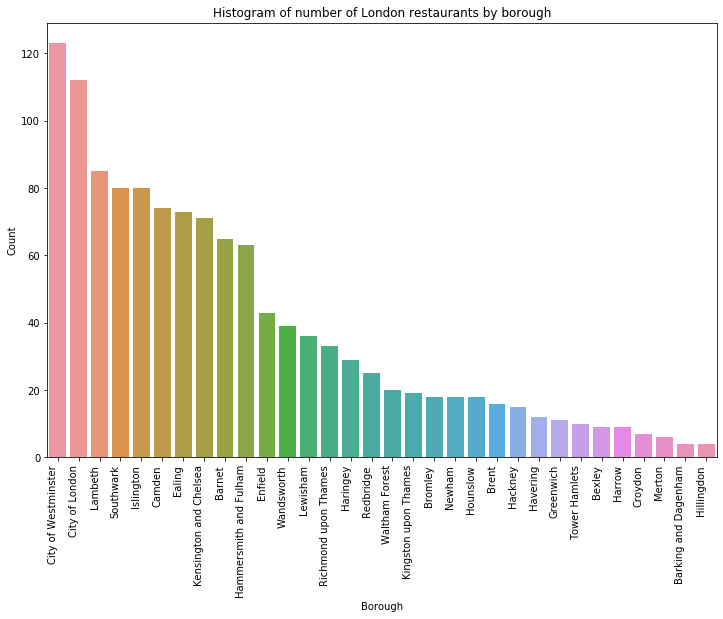

In [205]:
#Histogram of number of restaurants in each borough
plt.figure(figsize=(12,8))
plt.title('Histogram of number of London restaurants by borough')
ax2 = sns.barplot(x ='Borough',y= 'Count',data =Borough_counts)
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=90, horizontalalignment='right')

[Text(0, 0, 'City of Westminster'),
 Text(0, 0, 'Southwark'),
 Text(0, 0, 'Camden'),
 Text(0, 0, 'Wandsworth'),
 Text(0, 0, 'Kensington and Chelsea'),
 Text(0, 0, 'Hillingdon'),
 Text(0, 0, 'City of London'),
 Text(0, 0, 'Islington'),
 Text(0, 0, 'Redbridge'),
 Text(0, 0, 'Tower Hamlets'),
 Text(0, 0, 'Hackney'),
 Text(0, 0, 'Brent'),
 Text(0, 0, 'Lambeth'),
 Text(0, 0, 'Hammersmith and Fulham'),
 Text(0, 0, 'Barnet'),
 Text(0, 0, 'Richmond upon Thames'),
 Text(0, 0, 'Ealing'),
 Text(0, 0, 'Bromley'),
 Text(0, 0, 'Harrow'),
 Text(0, 0, 'Newham'),
 Text(0, 0, 'Haringey'),
 Text(0, 0, 'Greenwich'),
 Text(0, 0, 'Croydon'),
 Text(0, 0, 'Merton'),
 Text(0, 0, 'Lewisham'),
 Text(0, 0, 'Waltham Forest'),
 Text(0, 0, 'Enfield'),
 Text(0, 0, 'Hounslow'),
 Text(0, 0, 'Sutton'),
 Text(0, 0, 'Havering'),
 Text(0, 0, 'Kingston upon Thames'),
 Text(0, 0, 'Bexley'),
 Text(0, 0, 'Barking and Dagenham')]

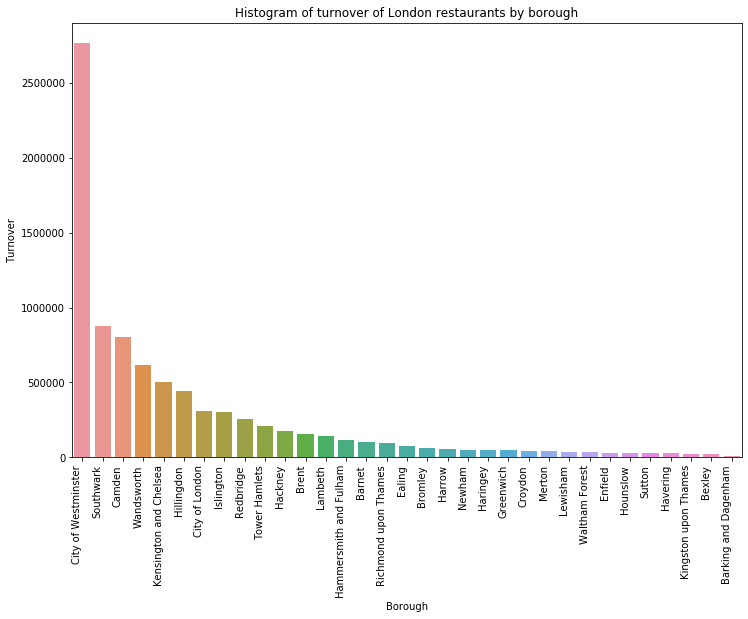

In [204]:
#reading turnover table
turnover_df = pd.read_csv('/Users/haoyunzhang/Downloads/ah503.csv')
turnover_df['Turnover'] = pd.to_numeric(turnover_df['Turnover'],errors='coerce')

#Histogram of turnover by borough
plt.figure(figsize=(12,8))
plt.title('Histogram of turnover of London restaurants by borough')
ax3 = sns.barplot(x ='Borough',y= 'Turnover',data = turnover_df)
ax3.set_xticklabels(ax3.get_xticklabels(), rotation=90, horizontalalignment='right')

We see that City of Westminster has both highest number of reataurants and total turnover. It will be the borough of our choice.

#### - City of Westminster exploratory analysis

In [207]:
#reading table from wikipedia
df = pd.read_html('https://en.wikipedia.org/wiki/List_of_areas_of_London')
df_london_sort = df[1]

We will use geopy to get latitude and longitude of all listed areas and use for later.

In [209]:
geonom_capstone = Nominatim(user_agent="absc")
df_london_sort['Address'] = df_london_sort['Location']+','+'London,England,United Kingdom'
df_london_sort['geoinfo'] = df_london_sort['Address'].apply(geonom_capstone.geocode)
df_london_sort['Latitude'] = df_london_sort['geoinfo'].apply(lambda x:x.latitude if x !=None else None)
df_london_sort['Longitude'] = df_london_sort['geoinfo'].apply(lambda x:x.longitude if x !=None else None)
df_london_sort.head()

,Location,London borough,Post town,Postcode district,Dial code,OS grid ref,Address,geoinfo,Latitude,Longitude
0,Abbey Wood,"Bexley, Greenwich [7]",LONDON,SE2,020,TQ465785,"Abbey Wood,London,England,United Kingdom","(Abbey Wood, Royal Borough of Greenwich, London, Greater London, England, SE2 0BS, United Kingdom, (51.487621, 0.1140504))",51.487621,0.114050
1,Acton,"Ealing, Hammersmith and Fulham[8]",LONDON,"W3, W4",020,TQ205805,"Acton,London,England,United Kingdom","(Acton, London Borough of Ealing, London, Greater London, England, W3 9LA, United Kingdom, (51.5081402, -0.2732607))",51.508140,-0.273261
2,Addington,Croydon[8],CROYDON,CR0,020,TQ375645,"Addington,London,England,United Kingdom","(Addington, London, Greater London, England, CR0 5AS, United Kingdom, (51.3586365, -0.0316347))",51.358637,-0.031635
3,Addiscombe,Croydon[8],CROYDON,CR0,020,TQ345665,"Addiscombe,London,England,United Kingdom","(Addiscombe, London Borough of Croydon, London, Greater London, England, CR0 6RB, United Kingdom, (51.3796916, -0.0742821))",51.379692,-0.074282
4,Albany Park,Bexley,"BEXLEY, SIDCUP","DA5, DA14",020,TQ478728,"Albany Park,London,England,United Kingdom","(Albany Park, Steynton Avenue, Hurst, Albany Park, London Borough of Bexley, London, Greater London, England, DA5 3HP, United Kingdom, (51.4353837, 0.1259653))",51.435384,0.125965


In [210]:
df_london_sort  = pd.read_csv('/Users/haoyunzhang/Downloads/london_area.csv')

In [215]:
#cleaning dataframe
df_london_sort = df_london_sort.dropna()
df_london_sort = df_london_sort.drop(index = 422)
df_london_sort.reset_index(drop = True, inplace = True)

In [217]:
#visualization of list of area

london_map = folium.Map(location=[london_location.latitude, london_location.longitude], zoom_start=12)
for lat, lng, area in zip(df_london_sort['Latitude'], df_london_sort['Longitude'], df_london_sort['Location']):
    label = '{}'.format(area)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(london_map)  
    
london_map

Great, we will then extract areas within City of Westminster and use them as starting points to find restaurants within the area.

In [94]:
def getNearbyVenues(names, latitudes, longitudes, radius=1000):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [23]:
CLIENT_ID = 'DKS24XF14QX5CXUDV0WIXEVGR5QGKYHTTNOJVPR2MEQJ5POQ' # your Foursquare ID
CLIENT_SECRET = '0BR1L4ORBGYKYKAY5PV3BZTQ4O1YXI5S4MX5EWAF2EOSRDGP' # your Foursquare Secret
VERSION = '20200605' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: DKS24XF14QX5CXUDV0WIXEVGR5QGKYHTTNOJVPR2MEQJ5POQ
CLIENT_SECRET:0BR1L4ORBGYKYKAY5PV3BZTQ4O1YXI5S4MX5EWAF2EOSRDGP


To get a better capture of restaurants in City of Westminster, we dedicate our limited calls to the borough.

In [61]:
westminster_df = df_london_sort[df_london_sort['London borough'].str.contains('Westminster',regex=False, case=False, na=False)]

In [99]:
LIMIT = 500


westminster_venues = getNearbyVenues(names=westminster_df['Location'],
                                   latitudes=westminster_df['Latitude'],
                                   longitudes=westminster_df['Longitude'],
                                   
                                  )

Aldwych
Bayswater
Belgravia
Charing Cross
Chinatown
Covent Garden
Knightsbridge
Lisson Grove
Little Venice
Maida Vale
Mayfair
Millbank
Paddington
Pimlico
Soho
St James's
St John's Wood
Temple
Westminster


In [84]:
westminster_res = pd.read_csv('/Users/haoyunzhang/Downloads/westminster_res.csv')

In [731]:
westminster_res_1 =westminster_venues[westminster_venues['Venue Category'].str.contains('Restaurant',regex=False, case=False, na=False)]
westminster_res_2 =westminster_venues[westminster_venues['Venue Category'].str.contains('Diner',regex=False, case=False, na=False)]
westminster_res_3 =westminster_venues[westminster_venues['Venue Category'].str.contains('Pub',regex=False, case=False, na=False)]

frames_wes_res = [westminster_res_1,westminster_res_2,westminster_res_3]

westminster_res = pd.concat(frames_wes_res)
westminster_res.reset_index(drop = True,inplace = True)
westminster_res.to_csv('/Users/haoyunzhang/Downloads/westminster_res.csv')
print('Number of restaurants in city of westminster: {}'.format(len(westminster_res)))

Number of restaurants in city of westminster: 505


Lets visualise the 505 restaurants.

In [390]:
westminster_map = folium.Map(location=[westminster_res['Neighborhood Latitude'].mean(),westminster_res['Neighborhood Longitude'].mean()], zoom_start=12)
def boroughs_style(feature):
    return { 'color': 'blue', 'fill': False }



folium.GeoJson(london_geo, style_function=boroughs_style, name='geojson').add_to(westminster_map)
for lat, lng, area in zip(westminster_res['Venue Latitude'], westminster_res['Venue Longitude'], westminster_res['Neighborhood']):
    label = '{}'.format(area)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(westminster_map)

westminster_map

We see two major clusters of restaurants at **north west(Paddington, Bayswater)** and **south east(Covent Garden, Mayfair, Knightsbride)** of the borough. (Although some restaurants are not in the boundary, they are of close neighborhood and worthwhile of consideration. City of London and Lambeth are also competitive candidate boroughs.)

Text(0, 0.5, 'Latitude')

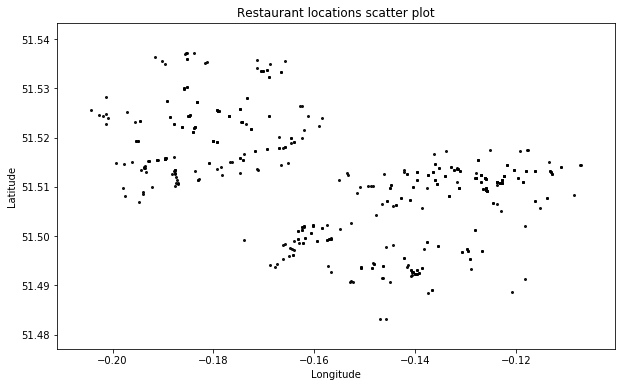

In [90]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=[10, 6])
cluster_scatter = ax.scatter(westminster_res['Venue Longitude'], westminster_res['Venue Latitude'], c='k', alpha=0.9, s=4)
ax.set_title('Restaurant locations scatter plot')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')


Now that we have a rough idead of distribution of all restaurants, lets cluster them and get the centroids

#### - Finding and clustering ideal locations

In [2]:
from sklearn.cluster import DBSCAN
from geopy.distance import great_circle
from shapely.geometry import MultiPoint
import matplotlib.colors as colors

In [6]:
coords_wes = westminster_res[['Venue Latitude', 'Venue Longitude']].to_numpy()

In [220]:
#DBSCAN clustering
kms_per_radian = 6371.0088
epsilon = 0.78/ kms_per_radian
db = DBSCAN(eps=epsilon, min_samples=1,algorithm='ball_tree', metric='haversine').fit(np.radians(coords_wes))
cluster_labels = db.labels_
num_clusters = len(set(cluster_labels))
clusters_db = pd.Series([coords_wes[cluster_labels == n] for n in range(num_clusters)])
print('Number of clusters: {}'.format(num_clusters))

Number of clusters: 3


In [78]:
#defining a function that will concatenate all cluster series
def getconcat(x,y):
    frames_cluster=[]
    for i in range(y):
        frames_cluster.append(pd.DataFrame(x[i]))
        frames_cluster[i].rename(columns = {0:'Latitude',1:'Longitude'},inplace  = True)
        frames_cluster[i]['Cluster Labels'] = i+1
    wes_merged_func = pd.concat(frames_cluster).reset_index(drop= True)
    return wes_merged_func   

In [104]:
def get_centermost_point(cluster):
    centroid = (MultiPoint(cluster).centroid.x, MultiPoint(cluster).centroid.y)
    return tuple(centroid)

In [219]:
wes_merged = getconcat(clusters_db,3)
wes_merged.head()

,Latitude,Longitude,Cluster Labels
0,51.513181,-0.117988,1
1,51.513312,-0.116194,1
2,51.513377,-0.120438,1
3,51.512232,-0.122371,1
4,51.511768,-0.119616,1


In [106]:
centermost_points = clusters_db.map(get_centermost_point)

cluster_names_wes=[]
for i in range(num_clusters):
    cluster_names_wes.append('Cluster'+' '+str(i+1))

lats, lons = zip(*centermost_points)
rep_points_wes = pd.DataFrame({'Latitude':lats, 'Longitude':lons,'Cluster label':cluster_names_wes})
rep_points_wes

,Latitude,Longitude,Cluster label
0,51.505542,-0.136860,Cluster 1
1,51.521454,-0.181738,Cluster 2
2,51.483243,-0.146427,Cluster 3


DBSCAN returned 3 clusters and we obtained centroids of them. Let's use folium to visualise our results.

In [107]:
wesmap_clusters = folium.Map(location=[westminster_res['Neighborhood Latitude'].mean(),westminster_res['Neighborhood Longitude'].mean()], zoom_start=12)

# set color scheme for the clusters
x = np.arange(num_clusters)
ys = [i + x + (i*x)**2 for i in range(num_clusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, cluster in zip(wes_merged['Latitude'], wes_merged['Longitude'], wes_merged['Cluster Labels']):
    label = folium.Popup('Cluster' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=2,
        popup=label,
        color=rainbow[cluster-1],
        fill=False,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(wesmap_clusters)
    
for lat,lon,cluster in zip(rep_points_wes['Latitude'],rep_points_wes['Longitude'],rep_points_wes['Cluster label']):
    
    label = folium.Popup(cluster, parse_html=True)
    
    folium.Marker(
        [lat,lon],
        popup = label
        ).add_to(wesmap_clusters)
    
    folium.Circle(
        [lat,lon],
        color = 'white',
        radius = 1800,
        fill=True,
        fill_opacity=0.3,
        ).add_to(wesmap_clusters)
    
wesmap_clusters

**Cluster 1** covers areas such as Knightsbridge, Mayfair, Covent Garden, Soho, and Oxford circus which are centers of fine dining, tourist attractions with dense foot traffic and popular hangouts. This is undoubtedly the golden cluster for restaurants or any other retailers. We will dedicate our effort in this cluster.

To find ideal locations, we first generate **equally-spaced(50 meters apart)** locations that covers entire Cluster 1 and select only locations that has **1 to 5** restaurants nearby within a radius of **250 meters** using **pyproj** which projects geographical locations into Xs and Ys.

In [53]:

#!pip install shapely
import shapely.geometry

#!pip install pyproj
import pyproj

import math

def lonlat_to_xy(lon, lat):
    proj_latlon = pyproj.Proj(proj='latlong',datum='WGS84')
    proj_xy = pyproj.Proj(proj="utm", zone=33, datum='WGS84')
    xy = pyproj.transform(proj_latlon, proj_xy, lon, lat)
    return xy[0], xy[1]

def xy_to_lonlat(x, y):
    proj_latlon = pyproj.Proj(proj='latlong',datum='WGS84')
    proj_xy = pyproj.Proj(proj="utm", zone=33, datum='WGS84')
    lonlat = pyproj.transform(proj_xy, proj_latlon, x, y)
    return lonlat[0], lonlat[1]

def calc_xy_distance(x1, y1, x2, y2):
    dx = x2 - x1
    dy = y2 - y1
    return math.sqrt(dx*dx + dy*dy)

In [54]:
def count_restaurants_nearby(x, y, restaurants, radius=250):    
    count = 0
    for i in range(len(restaurants)):
        res_x = restaurants['X'][i]; res_y = restaurants['Y'][i]
        d = calc_xy_distance(x, y, res_x, res_y)
        if d<=radius:
            count += 1
    return count

In [223]:
wes_merged_xy=[]
for lat, lon in zip(wes_merged['Latitude'],wes_merged['Longitude']):
    wes_merged_xy.append(lonlat_to_xy(lon,lat))
wes_merged_xy

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  if sys.path[0] == '':
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  if sys.path[0] == '':
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  if sys.path[0] == '':
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  if sys.path[0] == '':
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_lau

[(-546211.1280921665, 5816062.368529145),
 (-546084.6030045153, 5816050.710060786),
 (-546375.1145563058, 5816119.676723477),
 (-546534.8299960066, 5816021.5127983615),
 (-546356.1046988971, 5815930.283577138),
 (-545884.2125625942, 5816005.468871804),
 (-546442.3717457824, 5816253.700951817),
 (-546303.179249401, 5815826.661417473),
 (-546651.0432894405, 5815908.532368357),
 (-546628.8536504373, 5815867.216544643),
 (-546572.8531144129, 5815944.129197933),
 (-546100.3848352394, 5816530.12195218),
 (-546593.087178866, 5815868.161092447),
 (-546079.8137315682, 5816531.359722015),
 (-545718.637753109, 5816060.518207397),
 (-546846.3042997121, 5816104.832208628),
 (-546797.4858921986, 5816020.485234776),
 (-546842.7348712562, 5815763.433893345),
 (-546917.3679814297, 5816061.340859372),
 (-546791.9950900406, 5815994.912648598),
 (-546830.5801462998, 5815733.84914238),
 (-549200.5037749631, 5815111.476906792),
 (-549257.854169653, 5815104.02290376),
 (-549218.8010942319, 5815123.7668439215

In [224]:
df = pd.DataFrame(wes_merged_xy, columns = ['X','Y'])
wes_merged_disxy = pd.concat([wes_merged,df], axis =1)
wes_merged_disxy.head()

,Latitude,Longitude,Cluster Labels,X,Y
0,51.513181,-0.117988,1,-546211.128092,5.816062e+06
1,51.513312,-0.116194,1,-546084.603005,5.816051e+06
2,51.513377,-0.120438,1,-546375.114556,5.816120e+06
3,51.512232,-0.122371,1,-546534.829996,5.816022e+06
4,51.511768,-0.119616,1,-546356.104699,5.815930e+06


We are all set. Since the method uses only addition, we will have to offset our center of cluster to capture **Cluster 1**


In [173]:
cluster1_centerxy = lonlat_to_xy(-0.162703,51.488534)
cluster1_centerx = cluster1_centerxy[0]
cluster1_centery = cluster1_centerxy[1]

k = math.sqrt(3) / 2
x_step = 50
y_step = 50 * k


cluster1_latitudes = []
cluster1_longitudes = []
cluster1_xs = []
cluster1_ys = []
for i in range(0, int(71/k)):
    y = cluster1_centery + i * y_step
    x_offset = 25 if i%2==0 else 0
    for j in range(0, 71):
        x = cluster1_centerx + j * x_step + x_offset
        d = calc_xy_distance(cluster1_centerx, cluster1_centery, x, y)
        if (d <= 4000):
            lon, lat = xy_to_lonlat(x, y)
            cluster1_latitudes.append(lat)
            cluster1_longitudes.append(lon)
            cluster1_xs.append(x)
            cluster1_ys.append(y)
            
print(len(cluster1_latitudes), 'candidate neighborhood centers generated.')


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  if sys.path[0] == '':
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: DeprecationWarning: This function is deprecated. See: https

5274 candidate neighborhood centers generated.


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


In [174]:
#counting nearby restaurants

cluster1_restaurant_counts = []

for x, y in zip(cluster1_xs, cluster1_ys):
    count = count_restaurants_nearby(x, y, wes_merged_disxy, radius=250)
    cluster1_restaurant_counts.append(count)
print('done.')

done.


In [175]:
cluster1_locations = pd.DataFrame({'Latitude':cluster1_latitudes,
                                 'Longitude':cluster1_longitudes,
                                 'X':cluster1_xs,
                                 'Y':cluster1_ys,
                                 'Restaurants nearby':cluster1_restaurant_counts
                                 })

cluster1_locations.shape

(5274, 5)

In [176]:
cluster1_ideal_locations = cluster1_locations[(cluster1_locations['Restaurants nearby'] >= 1) & (cluster1_locations['Restaurants nearby'] <=5)]
cluster1_ideal_locations.shape

(1970, 5)

Let's visualise all 1970 locations.

In [177]:
cluster1_map = folium.Map(location=[westminster_res['Neighborhood Latitude'].mean(),westminster_res['Neighborhood Longitude'].mean()], zoom_start=12)
def boroughs_style(feature):
    return { 'color': 'blue', 'fill': False }

markers_colors = []
for lat, lon, cluster in zip(wes_merged['Latitude'], wes_merged['Longitude'], wes_merged['Cluster Labels']):
    label = folium.Popup('Cluster' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=2,
        popup=label,
        color=rainbow[cluster-1],
        fill=False,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(cluster1_map)

for lat,lon,cluster in zip(rep_points_wes['Latitude'],rep_points_wes['Longitude'],rep_points_wes['Cluster label']):
    label = folium.Popup(cluster, parse_html=True)
    folium.Marker(
        [lat,lon],
        popup = label
        ).add_to(cluster1_map)
    folium.Circle(
        [lat,lon],
        color = 'white',
        radius = 1800,
        fill=True,
        fill_opacity=0.3,
        ).add_to(cluster1_map)

folium.GeoJson(london_geo, style_function=boroughs_style, name='geojson').add_to(cluster1_map)
for lat, lng in zip(cluster1_ideal_locations['Latitude'], cluster1_ideal_locations['Longitude']):
    folium.CircleMarker(
        [lat, lng],
        radius=2,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(cluster1_map)
    
cluster1_map

These are the 1970 locations that satisfy previous requirements. They capture the periphery of sub clusters(Covent Garden, Mayfair) within Cluster 1 and covers area with low density of restaurants as well.

In [178]:
#use K-means, 20 number of clusters to cluster these locations.

from sklearn.cluster import KMeans
ideal_xy = cluster1_ideal_locations[['X', 'Y']].values
cluster1_kmeans = KMeans(n_clusters=20, random_state=0).fit(ideal_xy)
cluster1_centers = [xy_to_lonlat(cc[0], cc[1]) for cc in cluster1_kmeans.cluster_centers_]

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyp

In [225]:
#getting centroids of all clusters
cluster_centroids=[]
for i in range(20):
    cluster_centroids.append('Centroid'+' '+str(i+1))

label_df = pd.DataFrame(cluster_centroids)
label_df.rename(columns ={0:'Label'},inplace = True)

center_df1 = pd.concat([pd.DataFrame(cluster1_centers),label_df],axis = 1)
center_df1.rename(columns = {0:'Longitude',1:'Latitude'},inplace =True)

In [180]:
wes_centroid_xy=[]
for lat, lon in zip(center_df1['Latitude'],center_df1['Longitude']):
    wes_centroid_xy.append(lonlat_to_xy(lon,lat))
    
df2 = pd.DataFrame(wes_centroid_xy,columns = ['X','Y'])
center_df2= pd.concat([center_df1,df2],axis = 1)
center_df2

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  if sys.path[0] == '':
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  if sys.path[0] == '':
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  if sys.path[0] == '':
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  if sys.path[0] == '':
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_lau

,Longitude,Latitude,Label,X,Y
0,-0.139016,51.505397,Centroid 1,-547839.721845,5.815510e+06
1,-0.154342,51.512278,Centroid 2,-548733.533610,5.816492e+06
2,-0.147242,51.491265,Centroid 3,-548735.942120,5.814072e+06
3,-0.122329,51.506084,Centroid 4,-546675.365494,5.815343e+06
4,-0.136128,51.517159,Centroid 5,-547366.331412,5.816765e+06
5,-0.137040,51.497777,Centroid 6,-547881.680194,5.814641e+06
6,-0.167774,51.514487,Centroid 7,-549606.040084,5.816932e+06
7,-0.127921,51.500668,Centroid 8,-547186.547403,5.814827e+06
8,-0.156015,51.502549,Centroid 9,-549076.090131,5.815444e+06
9,-0.155007,51.492232,Centroid 10,-549247.905539,5.814292e+06


In [181]:
cluster1_centres_counts_250 = []

for x, y in zip(center_df2['X'],center_df2['Y']):
    count_cen_250 = count_restaurants_nearby(x, y, wes_merged_disxy, radius=250)
    cluster1_centres_counts_250.append(count_cen_250)

cluster1_centres_counts_500 = []
    
for x, y in zip(center_df2['X'],center_df2['Y']):
    count_cen_500 = count_restaurants_nearby(x, y, wes_merged_disxy, radius=500)
    cluster1_centres_counts_500.append(count_cen_500)
    
df_250 = pd.DataFrame(cluster1_centres_counts_250,columns = ['No. Restaurants within 250m'])
df_500 = pd.DataFrame(cluster1_centres_counts_500,columns = ['No. Restaurants within 500m'])

df_nores = pd.concat([df_250,df_500],axis = 1)
center_df3 = pd.concat([center_df2,df_nores],axis = 1)
center_df3

,Longitude,Latitude,Label,X,Y,No. Restaurants within 250m,No. Restaurants within 500m
0,-0.139016,51.505397,Centroid 1,-547839.721845,5.815510e+06,1,10
1,-0.154342,51.512278,Centroid 2,-548733.533610,5.816492e+06,3,8
2,-0.147242,51.491265,Centroid 3,-548735.942120,5.814072e+06,3,22
3,-0.122329,51.506084,Centroid 4,-546675.365494,5.815343e+06,4,21
4,-0.136128,51.517159,Centroid 5,-547366.331412,5.816765e+06,2,14
5,-0.137040,51.497777,Centroid 6,-547881.680194,5.814641e+06,5,11
6,-0.167774,51.514487,Centroid 7,-549606.040084,5.816932e+06,2,16
7,-0.127921,51.500668,Centroid 8,-547186.547403,5.814827e+06,2,10
8,-0.156015,51.502549,Centroid 9,-549076.090131,5.815444e+06,5,27
9,-0.155007,51.492232,Centroid 10,-549247.905539,5.814292e+06,3,11


We now have a dataframe of all centroids, lets visualise.

In [189]:
cluster1_map1 = folium.Map(location=[westminster_res['Neighborhood Latitude'].mean(),westminster_res['Neighborhood Longitude'].mean()], zoom_start=12)

folium.GeoJson(london_geo, style_function=boroughs_style, name='geojson').add_to(cluster1_map1)
for lat, lng in zip(westminster_res['Venue Latitude'], westminster_res['Venue Longitude']):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        color='red',
        fill=True,
        fill_opacity=1,
        parse_html=False).add_to(cluster1_map1)



    
for lat, lon, clusterlabel in zip(center_df3['Latitude'], center_df3['Longitude'],center_df3['Label']):
    label = folium.Popup(clusterlabel, parse_html=True)
    folium.Marker(
        [lat,lon],
        popup = label
        ).add_to(cluster1_map1)

for lat, lon in zip(center_df3['Latitude'], center_df3['Longitude']):
       folium.Circle(
        [lat,lon],
        color = 'white',
        radius = 500,
        fill=False,
        fill_opacity=0.3,
        ).add_to(cluster1_map1)

        
cluster1_map1  
    
    

With a specified number of 20 clusters, we reduce the set to a manageable size. The blue markers represents centroid of each cluster; white circles has a radius of 500 meters which covers all candidate locations and the red dots are existing restaurants. 

We see that the areas covered by the white circles have relatively lower number of red dots. Therefore, there are still vacancy in this extremely competitive center of culinary attractions.


Let's use reverse geopy to convert latitudes and longitudes to addresses.

In [184]:

center_df = center_df3
geolocator = Nominatim(user_agent = 'user_agent1')

center_df['Geoinfo'] = center_df['Latitude'].map(str)+','+center_df['Longitude'].map(str)
center_df['Address'] = center_df['Geoinfo'].apply(geolocator.reverse)
pd.set_option('display.max_colwidth', -1)
Westminster_sugguested_locations = center_df[['Address','No. Restaurants within 250m','No. Restaurants within 500m']]
Westminster_sugguested_locations['Address'] = Westminster_sugguested_locations['Address'].apply(lambda x: x.address)
Westminster_sugguested_locations

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,Address,No. Restaurants within 250m,No. Restaurants within 500m
0,"Chutney Mary, Little St. James's Street, St. James's, Victoria, City of Westminster, London, Greater London, England, SW1A 1JB, United Kingdom",1,10
1,"Lees Court, 22, Lees Place, St. James's, Mayfair, City of Westminster, London, Greater London, England, W1K 6LW, United Kingdom",3,8
2,"Sri Suwoon Thai Restaurant, 44, Hugh Street, St. James's, Victoria, City of Westminster, London, Greater London, England, SW1V 4EP, United Kingdom",3,22
3,"Joseph Bazalgette, Victoria Embankment, Westminster, Covent Garden, City of Westminster, London, Greater London, England, SW1A 2HR, United Kingdom",4,21
4,"York House, 10-12, Berners Street, Cavendish Square & Oxford Market (South), Fitzrovia, City of Westminster, London, Greater London, England, W1T 3NG, United Kingdom",2,14
5,"62 Buckingham Gate, Spenser Street, Westminster, Victoria, City of Westminster, London, Greater London, England, SW1E 6AZ, United Kingdom",5,11
6,"2, Hyde Park Square, Paddington, City of Westminster, London, Greater London, England, W2 2JZ, United Kingdom",2,16
7,"Little George Street, Westminster, Millbank, City of Westminster, London, Greater London, England, SW1P 3AL, United Kingdom",2,10
8,"Parkside, Knightsbridge, 28-52, Knightsbridge, Belgravia, City of Westminster, London, Greater London, England, SW1X 7JN, United Kingdom",5,27
9,"16-22, Bourne Street, Belgravia, City of Westminster, London, Greater London, England, SW1W 8JR, United Kingdom",3,11


In [185]:
center_df.to_csv('/Users/haoyunzhang/Downloads/westminster_ideal.csv')

In [187]:
Westminster_sugguested_locations.to_csv('/Users/haoyunzhang/Downloads/westminster_ideal_withnores.csv')

### - Results and Discussion 

<a name="results"></a>

- Above is the dataframe of all ideal locations clusters centroids. Number of restaurants within 250 meters is set between 1 to 5 and has a mean of 2.6. Number of restaurants within 500 meters has a mean of 14.8. For a radius of 500 meters, St Giles, Bloomsbury, highlighted in red, has the highest number 29 restaurants nearby and County halls, highlighted in green, has only 3 restaurants nearby. 

    - County hall is a residential building next to Waterloo train station and London eye, both of which contribute significantly to foot traffic, thereby bringing possible high volumes of customers. It is a promising area for a new restaurant.
    - St Giles, Bloomsbury is next to Tottenham court road tube station and minutes away from Covent Garden and Soho. Surrounded by tube station and center of popular hangouts, the area is no less appealing than County hall.

- It is crucial to note that opening a restaurant is ultimately a comprehensive task with many dimensions that need to be considered, location is only one piece of the puzzle. Depending on the actual financial budget, cuisine style, targeting audience, stakeholders may adjust their choices among all suggested centroids. This project only aims to provide information in the aspect of location and practice implementation of studied codes.

### - Conclusion 

<a name="conclusion"></a>

According to the overview, with its high total turnover and diverse culinary culture, we found City of Westminster to be a promising borough to open a restaurant in. All existing restaurants in the borough were clustered using DBSCAN and Cluster 1 which covers more culinary attractions was focused on. Ideal locations were selected within a radius of 1.8 km from the centroid of Cluster 1 and were clustered using K-means with a number of 20 clusters.

It is demonstrated that, despite fierce competition, there are promising areas in the periphery of sub clusters of existing restaurants and next to transport junctions, tourist attractions such as Waterloo train station and London eye. All analysis resulted in 20 centroids scattered mostly inside Cluster 1. A final decision may requires more information on other aspects of the restaurant due to the nature of the task of opening a restaurant.
